In [1]:
# %load_ext autoreload
# %autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm
import sctop as top
from itertools import combinations

In [14]:
# Change seaborn settings to make our plots prettier
# Feel free to edit as desired, or remove entirely
sns.set(context='talk', color_codes=True, palette='deep', style='whitegrid',
        rc={'mathtext.fontset': 'cm', 'xtick.direction': 'in','ytick.direction': 'in',
            'axes.linewidth': 1.5, 'figure.dpi':400, 'text.usetex':False}) #font_scale=0.3,

In [3]:
basis_MCKO, tags_MCKO = top.load_basis('MC-KO', 0)
basis_LD, tags_LD = top.load_basis('LD', 0)

basis_MCKO_cutoff, tags_MCKO_cutoff = top.load_basis('MC-KO', 100)
basis_LD_cutoff, tags_LD_cutoff = top.load_basis('LD', 100)

In [4]:
# Add lung early epithelium to basis
epithelium_profile = basis_LD_cutoff.loc[:,'Lung Early Epithelium Cell E12 LD21']
basis_genes = np.intersect1d(basis_MCKO_cutoff.index, basis_LD_cutoff.index)
new_basis = pd.concat([basis_MCKO_cutoff.loc[basis_genes],
                      epithelium_profile.loc[basis_genes]],
                      axis=1
                     )

# Plot trajectory of ALD AT1 and AT2 in new basis
alveolar_types = [alveolar for alveolar in tags_LD.index if 
                  ('AT' in alveolar)
                  and ('Mk' not in alveolar)
                  and not ((' P' in alveolar) and (' P0' not in alveolar))
                 ]
alveolar_data = basis_LD.loc[:, alveolar_types]
alveolar_projections = top.score(new_basis, alveolar_data)

In [5]:
from matplotlib.cm import ScalarMappable

def create_colorbar(data, label, colormap='rocket_r', **kwargs):
#     ax = ax or plt.gca()
    
    cmap = plt.get_cmap(colormap)
    scalarmap = ScalarMappable(norm=plt.Normalize(min(data), max(data)),
                               cmap=cmap)
    scalarmap.set_array([])
    plt.colorbar(scalarmap, label=label, **kwargs)
    
    return cmap

["The genomic, epigenomic and biophysical cues controlling the emergence of the gas exchange niche in the lung"](https://www-ncbi-nlm-nih-gov.ezproxy.bu.edu/geo/query/acc.cgi?acc=GSE149563)

In [6]:
from scanpy import read_h5ad
import h5py

metadata_file = '/projectnb/biophys/mariay/mouse/samples/GSE149563 (lung emergence)/local.h5ad'
lungMAP_metadata = read_h5ad(metadata_file)

lungMAP_files = {'E12.5': 'GSM4504959_E12.5', 
                 'E15.5': 'GSM4504960_E15.5', 
                 'E17.5': 'GSM4504961_E17.5', 
                 'P3': 'GSM4504962_P3', 
                 'P7': 'GSM4504963_P7', 
                 'P15': 'GSM4504964_P15', 
                 'P42': 'GSM4504965_P42'
                }

lungMAP_data = dict()

for day, substring in tqdm(lungMAP_files.items()):
#     Only run the commented-out part when reading in for the first time
#     file_string = '/projectnb/biophys/mariay/mouse/samples/GSE149563 (lung emergence)/{}_filtered_gene_bc_matrices.h5'.format(lungMAP_files[day])
#     lungMAP_files[day] = h5py.File(file_string, 'r')
    current_dataframe = pd.read_csv("/project/biophys/mouse scRNA-seq/scTOP explorations/scTOP/manuscript/manuscript data/lungMAP_{}.csv".format(day))
    current_dataframe = current_dataframe.set_index('Unnamed: 0')
    common_genes = np.intersect1d(lungMAP_metadata.var.index, current_dataframe.index)
    current_dataframe = current_dataframe.loc[common_genes]
    current_dataframe.index = lungMAP_metadata.var.feature_name.loc[common_genes].values
    lungMAP_data[day] = current_dataframe

100%|██████████| 7/7 [06:40<00:00, 57.24s/it]


In [7]:
# look at type I & II pneumocytes as well as progenitor cell
types = ['type I pneumocyte', 'type II pneumocyte', 'progenitor cell', 'club cell']
lungMAP_processed = dict()
lungMAP_scores = dict()

for current_type in tqdm(types):
    barcodes = lungMAP_metadata.obs.index[lungMAP_metadata.obs['cell_type'] == current_type]
    current_raw_list = []
    current_timepoints = np.array([])
    
    for day, dataframe in lungMAP_data.items():
        relevant_barcodes = np.intersect1d(barcodes, dataframe.columns)
        current_raw_list += [dataframe.loc[:, relevant_barcodes]]
        timepoints = np.full(len(relevant_barcodes), day)
        current_timepoints = np.append(current_timepoints, timepoints)
        
    current_raw = pd.concat(current_raw_list, axis=1)
    current_processed = top.process(current_raw)
    lungMAP_processed[current_type] = current_processed
    
    current_scores = top.score(new_basis, current_processed)
    lungMAP_scores[current_type] = current_scores
    lungMAP_scores[current_type].loc['day'] = current_timepoints
    lungMAP_scores[current_type].loc['annotation'] = np.full(len(current_timepoints), current_type)

100%|██████████| 4/4 [00:49<00:00, 12.47s/it]


In [8]:
birth_days = 18

day_to_value_dict = {'E12.5': 12.5, 
                     'E15.5': 15.5, 
                     'E17.5': 17.5,
                     'P3':birth_days+3,
                     'P7':birth_days+7,
                     'P15':birth_days+15,
                     'P42':birth_days+42}

In [9]:
print("Detection rate: {}".format(1- ((current_raw == 0).sum()/22266).mean()))

Detection rate: 0.14684479934657357


In [10]:
current_data = pd.concat([lungMAP_scores['type I pneumocyte'], lungMAP_scores['type II pneumocyte'], lungMAP_scores['progenitor cell']], axis=1)
days = list(day_to_value_dict.keys())

# Animation of differentiating alveolar cells

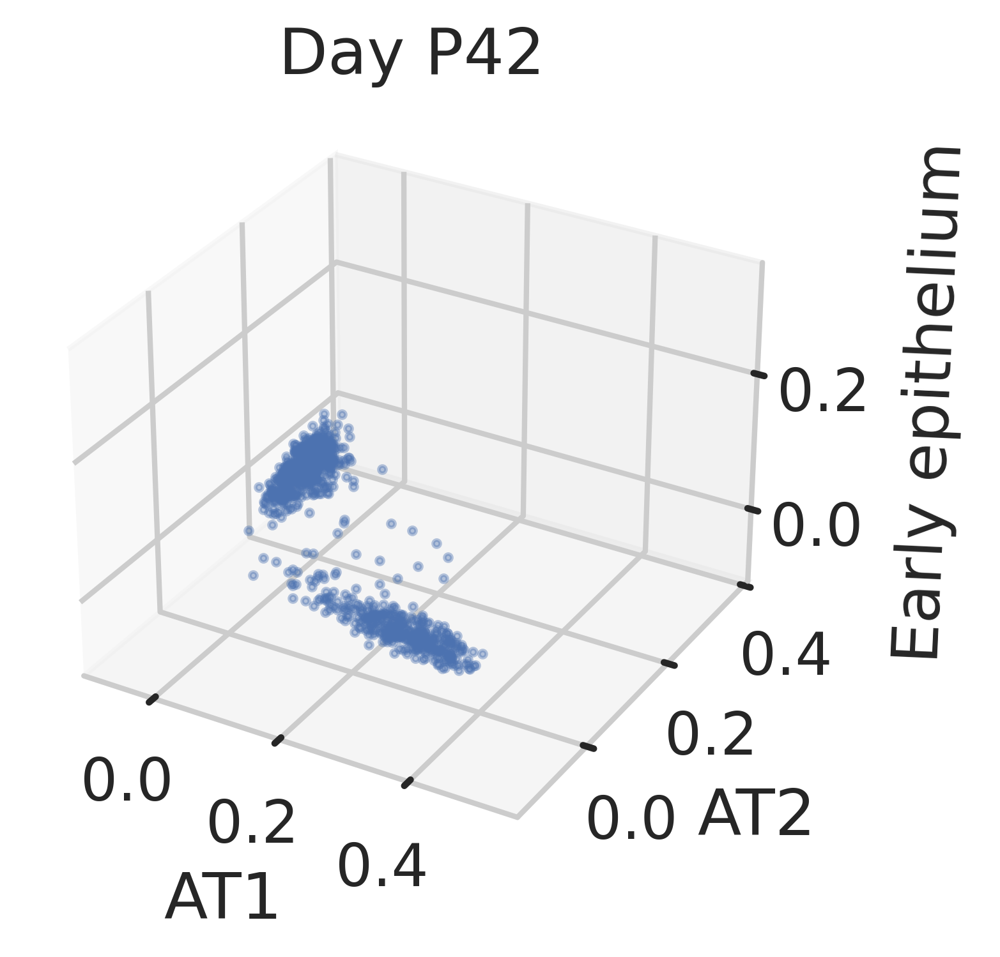

In [30]:
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython import display

current_data = pd.concat([lungMAP_scores['type I pneumocyte'], lungMAP_scores['type II pneumocyte'], lungMAP_scores['progenitor cell']], axis=1)
typeX = 'Lung AT1 Cell WK6 KO22' 
typeY = 'Lung AT2 Cell WK6 KO22'
typeZ = 'Lung Early Epithelium Cell E12 LD21'
    
days = list(day_to_value_dict.keys())
 
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax.view_init(elev=15, azim=-20)
# xdata, ydata = [], []
graph, = ax.plot([], [], [], 'bo', linestyle="", markersize=2, alpha=0.4)
 
def init():
    ax.set_xlim([-0.1, 0.55])
    ax.set_ylim([-0.15, 0.4])
    ax.set_zlim([-0.1, 0.35])
    
    ax.set_xlabel("AT1", labelpad=10)
    ax.set_ylabel("AT2", labelpad=10)
    ax.set_zlabel("Early epithelium", labelpad=10)
    
    return graph,
 
def update(day):
    frame_data = current_data.loc[:, current_data.loc['day'] == day]
    graph.set_data(frame_data.loc[typeX], frame_data.loc[typeY])
    graph.set_3d_properties(frame_data.loc[typeZ])

    ax.set_title('Day {}'.format(day))
    return graph, 
 
ani = FuncAnimation(fig, update, frames=days, init_func=init, blit=True, interval=40)

ani.save("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/3D lungMAP animation.gif", dpi=300, writer=PillowWriter(fps=1))

# 3D plot and 2D projections

In [11]:
current_data = pd.concat([lungMAP_scores['type I pneumocyte'], lungMAP_scores['type II pneumocyte'], lungMAP_scores['progenitor cell']], axis=1)

typeX = 'Lung AT1 Cell WK6 KO22' # type to plot on x-axis
typeY = 'Lung AT2 Cell WK6 KO22' # type to plot on y-axis
typeZ = 'Lung Early Epithelium Cell E12 LD21'

label_dict = {typeX: 'AT1',
              typeY: 'AT2',
              typeZ: 'Early Epithelium'
             }

color_dict = {typeX: 'tab:blue',
              typeY: 'tab:red',
              typeZ: 'tab:green'
             }

birth_day = 21

day_conversion = {'E12.5': 12.5, 
                 'E15.5': 15.5, 
                 'E17.5': 17.5, 
                 'P3': 3 + birth_day, 
                 'P7': 7 + birth_day,  
                 'P15': 15 + birth_day,  
                 'P42': 42 + birth_day
                }

days = [day_conversion[day] for day in current_data.loc['day']]

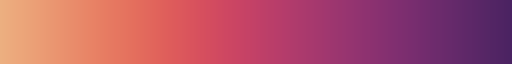

In [39]:
sns.color_palette("flare", as_cmap=True)

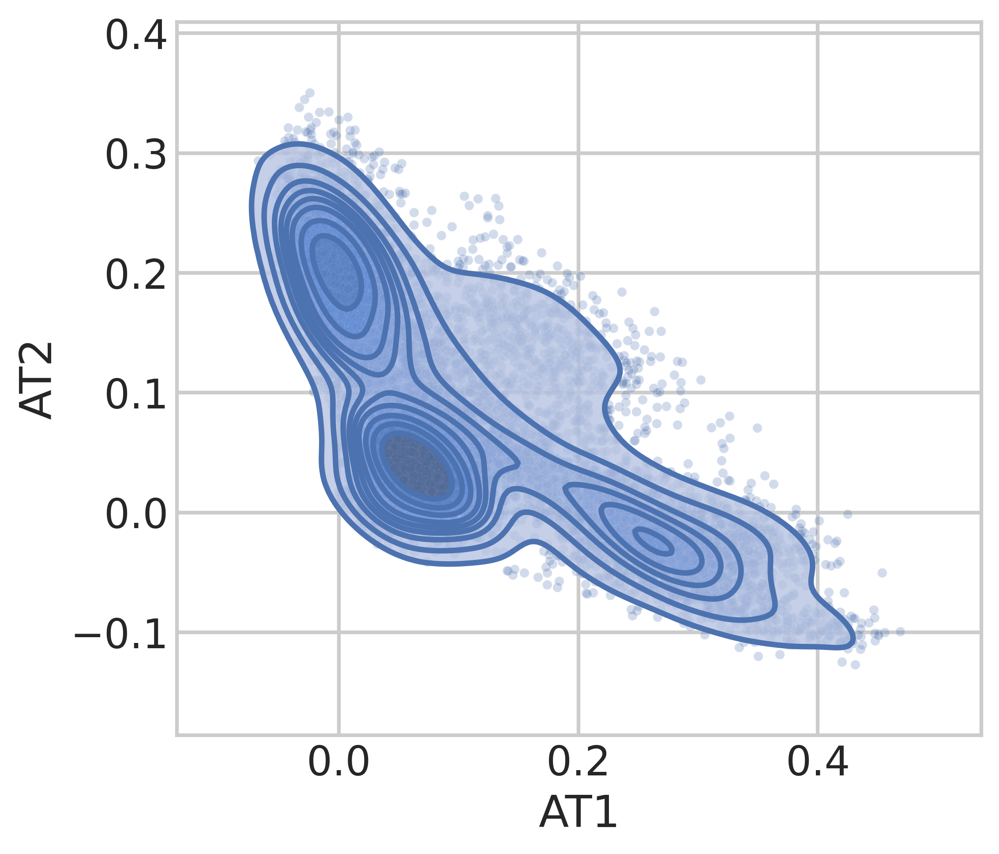

In [21]:
fig = plt.figure(figsize=(6,6))
sns.scatterplot(x = current_data.loc[typeX], 
                y = current_data.loc[typeY],
                color = sns.color_palette()[0],
                alpha = 0.25,
                s = 15
               )

sns.kdeplot(x = current_data.loc[typeX], 
            y = current_data.loc[typeY],
            fill=True,
            alpha=0.8,
#             color='tab:blue'
           )

sns.kdeplot(x = current_data.loc[typeX], 
            y = current_data.loc[typeY],
#             color='tab:blue'
           )

plt.gca().set_aspect('equal')

plt.tight_layout()
plt.xlabel('AT1')
plt.ylabel('AT2')


plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/lungmap projections (kdeplot).png", bbox_inches = "tight")

plt.show()

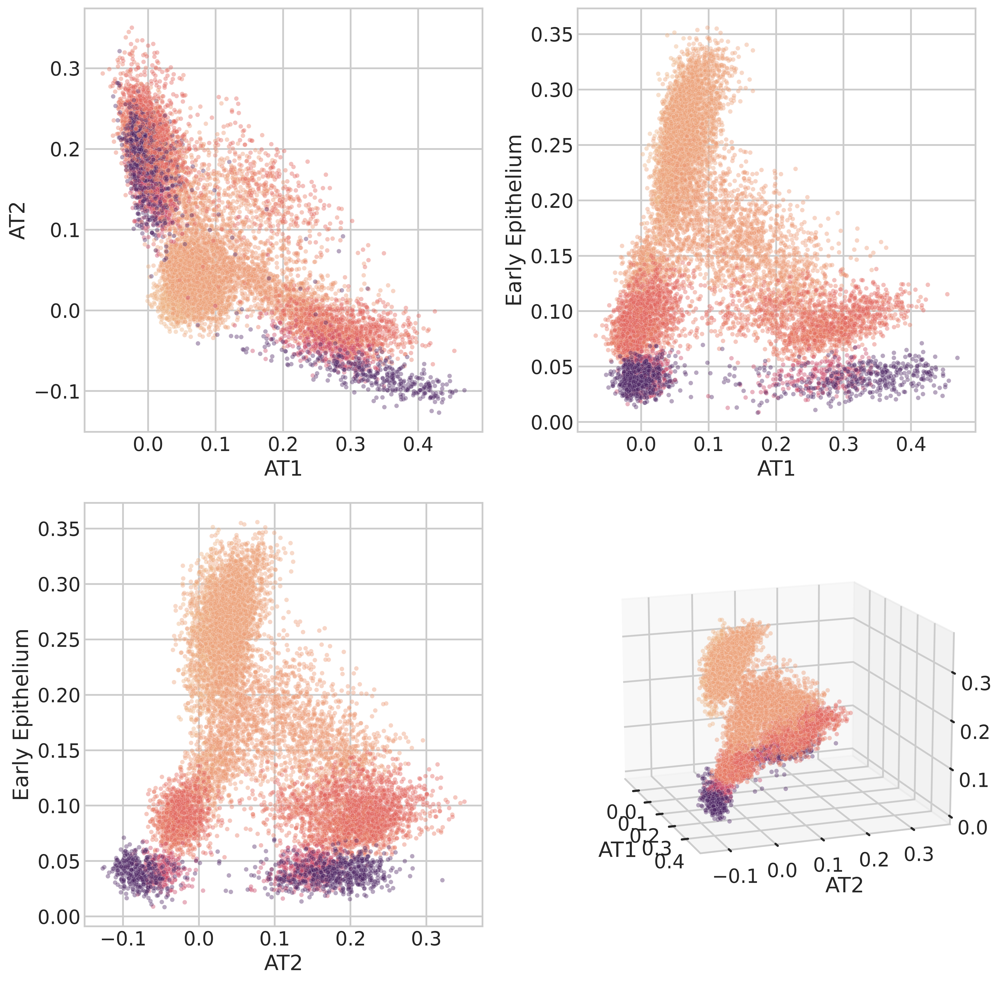

In [53]:
fig = plt.figure(figsize=(12,12))

kwargs = {"c": days,
          "cmap": sns.color_palette("flare", as_cmap=True),
          "alpha": 0.4,
          "s": 15,
          "edgecolors": 'white',
          "linewidth": 0.2
         }

for subplot_index, pair in enumerate(combinations([typeX, typeY, typeZ], 2)):
    ax = fig.add_subplot(2, 2, subplot_index+1)


    ax.scatter(current_data.loc[pair[0]], current_data.loc[pair[1]], **kwargs)
    
#     ax.spines['bottom'].set_color(color_dict[pair[0]])  # X-axis (bottom spine)
#     ax.spines['left'].set_color(color_dict[pair[1]])   # Y-axis (left spine)

#     # Set the tick color for each axis
#     ax.xaxis.set_tick_params(colors=color_dict[pair[0]])  # X-axis ticks
#     ax.yaxis.set_tick_params(colors=color_dict[pair[1]]) # Y-axis ticks

#     # Set the label color for each axis
#     ax.xaxis.label.set_color(color_dict[pair[0]])
#     ax.yaxis.label.set_color(color_dict[pair[1]])
    
    ax.set_xlabel(label_dict[pair[0]])
    ax.set_ylabel(label_dict[pair[1]])
#     ax.set_xlim([-0.15, 0.5])
#     ax.set_ylim([-0.15, 0.5])
    
view = [15, -20]
ax = fig.add_subplot(2, 2, 4, projection='3d')

ax.scatter(current_data.loc[typeX], current_data.loc[typeY], current_data.loc[typeZ], **kwargs)
    
ax.view_init(elev=view[0], azim=view[1])

ax.set_xlabel(label_dict[typeX], labelpad=10)
ax.set_ylabel(label_dict[typeY], labelpad=10)
ax.set_zlabel(label_dict[typeZ], labelpad=10)


# ax.set_xlim([-0.15, 0.5])
# ax.set_ylim([-0.15, 0.5])
# ax.set_zlim([-0.15, 0.5])

# ax.xaxis.line.set_color('tab:blue')
# ax.yaxis.line.set_color('tab:red')
# ax.zaxis.line.set_color('tab:green')   

# ax.xaxis.set_tick_params(colors='tab:blue')
# ax.yaxis.set_tick_params(colors='tab:red')
# ax.zaxis.set_tick_params(colors=color_dict[pair[1]])

# ax.xaxis.label.set_color('tab:blue')
# ax.yaxis.label.set_color('tab:red')
# ax.zaxis.label.set_color('tab:green')

plt.tight_layout()

plt.savefig("/project/biophys/scTOP analyses/Hopfield landscape paper/figs/lungmap projections (colored by time).png", bbox_inches = "tight")
    
plt.show()

In [49]:
plt.figure(figsize=(6,6))

current_data = pd.concat([lungMAP_scores['type I pneumocyte'], lungMAP_scores['type II pneumocyte'], lungMAP_scores['progenitor cell']], axis=1)
typeX = 'Lung AT1 Cell WK6 KO22' # type to plot on x-axis
typeY = 'Lung AT2 Cell WK6 KO22' # type to plot on y-axis

# current_data = current_data.loc[:,current_data.loc['day'] == 'P3']
gene = 'Icam1'
# gene = 'Wnt2'
hue_array = pneumocytes.loc[gene]
    
cmap = create_colorbar(hue_array, gene,
                       colormap='viridis', ax = plt.gca()) 
    
sns.scatterplot(x=current_data.loc[typeX],
                y=current_data.loc[typeY],
                hue=hue_array,
                legend=False,
                palette='viridis',
                linewidth=0.1,
                s = 20,
                ax=plt.gca()
               )

plt.xlabel('Lung alveolar type 1')
plt.ylabel('Lung alveolar type 2')
plt.gca().set_aspect('equal')
plt.xlim([-0.1, 0.55])
plt.ylim([-0.15, 0.4])
plt.show()

NameError: name 'pneumocytes' is not defined

<Figure size 2400x2400 with 0 Axes>

/scratch/170149.1.ood/ipykernel_16423/1878469578.py:10: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(scalarmap, label=label, **kwargs)


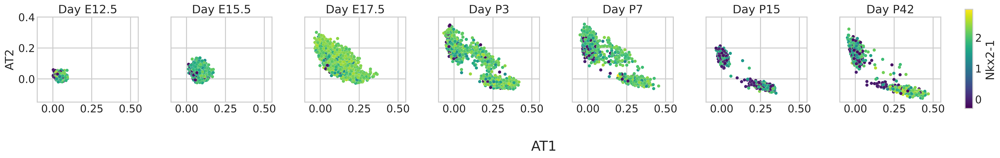

In [36]:
fig, axes = plt.subplots(1, 8, figsize=(24,4))
axes_list = axes.flatten()

days = ['E12.5', 'E15.5', 'E17.5',  'P3', 'P7', 'P15', 'P42']

all_data = pd.concat([lungMAP_scores['type I pneumocyte'], lungMAP_scores['type II pneumocyte'], lungMAP_scores['progenitor cell']], axis=1)
typeX = 'Lung AT1 Cell WK6 KO22' # type to plot on x-axis
typeY = 'Lung AT2 Cell WK6 KO22' # type to plot on y-axis

gene = 'Nkx2-1'

hue_norm = (min(pneumocytes.loc[gene]), max(pneumocytes.loc[gene]))

for day, ax in zip(days, axes_list):
    current_data = all_data.loc[:,all_data.loc['day'] == day]
    hue_array = pneumocytes.loc[gene, current_data.columns]

    sns.scatterplot(x=current_data.loc[typeX],
                    y=current_data.loc[typeY],
                    hue = hue_array,
                    legend=False,
                    palette='viridis',
                    linewidth=0.1,
                    s = 25,
                    hue_norm = hue_norm,
                    ax=ax
                   )
    
    if ax == axes_list[0]:
        ax.set_ylabel('AT2')
    else:
        ax.tick_params(axis='y', labelleft=False)
        ax.set_ylabel('')
        
    ax.set_xlabel('')
    ax.set_aspect('equal')
    ax.set_xlim([-0.1, 0.55])
    ax.set_ylim([-0.15, 0.4])
    ax.set_title('Day {}'.format(day))
    
    
plt.tight_layout()

ax = axes_list[-1]
cmap = create_colorbar(hue_norm, gene,
                           colormap='viridis', cax = ax)

bbox=ax.get_position()
ax.set_position([bbox.x0-0.05, bbox.y0+0.12, bbox.x1 - bbox.x0, (bbox.y1 - bbox.y0)*0.7], which='both')
ax.set_aspect(4)
fig.supxlabel('AT1')
# fig.suptitle('Zepp et al. epithelial lung data, colored by gene {}'.format(gene))
plt.show()